In [ ]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

In [1]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git 

In [1]:
import pandas as pf 

In [2]:
# !pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="J1mmAuxLk77g4eiOvCmr")
project = rf.workspace("cauliflower-diseases").project("cauliflower-diseases-recognition")
version = project.version(3)
dataset = version.download("yolov11")
                

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Cauliflower-Diseases-Recognition-3 in yolov11:: 100%|██████████| 1296/1296 [00:19<00:00, 64.82it/s] 


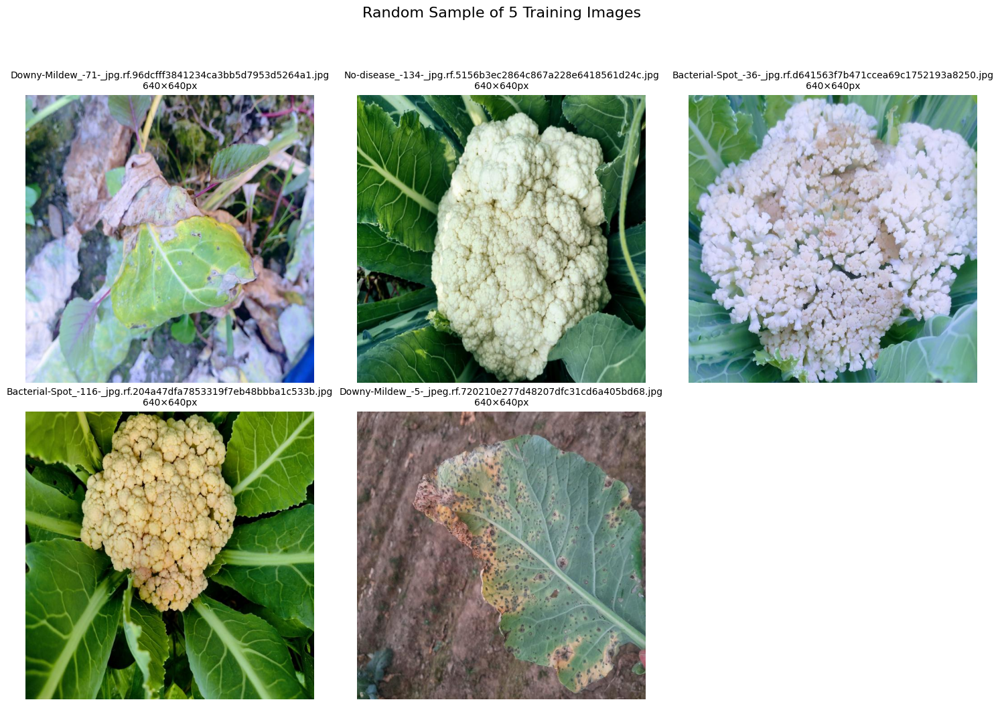

In [1]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Set the path to the images directory
image_dir = r"Cauliflower-Diseases-Recognition-3\test\images"  # Update with your directory path

# Get a list of all image files
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

if not image_files:
    print("No images found in the directory!")
    exit()

# Determine sample size (max 5 or available images)
sample_size = min(5, len(image_files))
random_images = random.sample(image_files, sample_size)

# Calculate grid layout (max 3 columns)
cols = min(3, sample_size)
rows = (sample_size + cols - 1) // cols  # Ceiling division

# Create figure with appropriate size
fig = plt.figure(figsize=(5 * cols, 5 * rows))
fig.suptitle(f"Random Sample of {sample_size} Training Images", fontsize=16, y=1.05)

# Display each image
for i, img_file in enumerate(random_images, 1):
    try:
        img_path = os.path.join(image_dir, img_file)
        img = Image.open(img_path)
        
        ax = fig.add_subplot(rows, cols, i)
        ax.imshow(img)
        
        # Add informative title with filename and dimensions
        title = f"{img_file}\n{img.size[0]}×{img.size[1]}px"
        ax.set_title(title, fontsize=10)
        ax.axis('off')
        
    except Exception as e:
        print(f"Error loading {img_file}: {str(e)}")
        continue

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [3]:
import torch
import torchvision
from ultralytics import YOLO
print(torch.__version__, torch.version.cuda)
print(torchvision.__version__)
print(torch.cuda.is_available())


FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
2.7.0+cu118 11.8
0.22.0+cu118
True


In [3]:
from ultralytics import YOLO
model = YOLO("yolov8n.pt") 

results = model.train(
    data=r"Cauliflower-Diseases-Recognition-3\data.yaml", 
    epochs=30,                     
    imgsz=640,                  
    batch=16,                     
    project="yolov8-kaggle-training", 
    name="output", 
    cache=True                    
)

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
New https://pypi.org/project/ultralytics/8.3.169 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=Cauliflower-Diseases-Recognition-3\data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=True, device=None, workers=8, project=yolov8-kaggle-training, name=output, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1

100%|██████████| 5.26M/5.26M [00:00<00:00, 16.3MB/s]


AMP: checks passed 


train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels... 449 images, 0 backgrounds, 0 corrupt: 100%|██████████| 449/449 [00:00<00:00, 1009.19it/s]

train: New cache created: D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels.cache


WARNING  cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.5GB RAM): 100%|██████████| 449/449 [00:00<00:00, 2608.04it/s]
val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<00:00, 244.05it/s]

val: New cache created: D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache


WARNING  cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 127/127 [00:00<00:00, 2350.61it/s]


Plotting labels to yolov8-kaggle-training\output\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8-kaggle-training\output
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.24G     0.5733      2.462      1.294          2        640: 100%|██████████| 29/29 [00:06<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.79it/s]

                   all        127        131     0.0249      0.969      0.251      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.1G     0.3359      1.307      1.088          3        640: 100%|██████████| 29/29 [00:02<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.33it/s]

                   all        127        131      0.839      0.238        0.3      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.19G     0.3428      1.031      1.078          4        640: 100%|██████████| 29/29 [00:02<00:00, 10.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.79it/s]

                   all        127        131      0.602      0.246      0.116     0.0297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.2G     0.3489     0.9574      1.096          2        640: 100%|██████████| 29/29 [00:02<00:00, 10.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.66it/s]

                   all        127        131      0.796      0.471       0.51      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.18G     0.3623     0.8847       1.11          4        640: 100%|██████████| 29/29 [00:02<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.83it/s]

                   all        127        131      0.707      0.465      0.519      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.19G     0.3605     0.8455      1.142          2        640: 100%|██████████| 29/29 [00:03<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]

                   all        127        131      0.389       0.62      0.537      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.19G     0.3128     0.7434      1.064          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]

                   all        127        131      0.548      0.757      0.702      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       2.2G     0.3146     0.7039      1.072          3        640: 100%|██████████| 29/29 [00:03<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]

                   all        127        131      0.559      0.729      0.736      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.18G     0.2915     0.6955      1.038          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]

                   all        127        131      0.689      0.679      0.765      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.19G     0.2994     0.6456      1.054          2        640: 100%|██████████| 29/29 [00:03<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.98it/s]

                   all        127        131       0.72      0.763      0.768      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.19G     0.2759     0.6107      1.027          2        640: 100%|██████████| 29/29 [00:03<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.71it/s]

                   all        127        131      0.844      0.796      0.829      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       2.2G     0.2562     0.5474       1.01          4        640: 100%|██████████| 29/29 [00:03<00:00,  8.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]

                   all        127        131      0.747      0.745       0.81      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.18G     0.2462     0.5168      1.023          4        640: 100%|██████████| 29/29 [00:03<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.92it/s]

                   all        127        131      0.922      0.754      0.882      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.19G     0.2428     0.5452      1.008          2        640: 100%|██████████| 29/29 [00:03<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]

                   all        127        131      0.879      0.847      0.907      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       2.2G      0.238     0.4718     0.9971          4        640: 100%|██████████| 29/29 [00:03<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.96it/s]

                   all        127        131      0.884       0.83      0.926      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       2.2G     0.2256     0.4471     0.9852          4        640: 100%|██████████| 29/29 [00:03<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.59it/s]

                   all        127        131      0.903      0.857      0.909      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.18G       0.22     0.4427     0.9825          4        640: 100%|██████████| 29/29 [00:03<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]

                   all        127        131      0.931      0.834      0.934      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.19G     0.2165     0.4285     0.9925          2        640: 100%|██████████| 29/29 [00:03<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.02it/s]

                   all        127        131      0.957      0.889      0.951      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.19G     0.2062     0.3867      0.979          4        640: 100%|██████████| 29/29 [00:02<00:00, 10.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.93it/s]

                   all        127        131      0.899      0.846      0.931      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.19G     0.1997     0.3766     0.9855          3        640: 100%|██████████| 29/29 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]

                   all        127        131      0.923      0.883      0.938      0.711


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.18G     0.5937       2.07      1.586          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.96it/s]

                   all        127        131      0.625       0.72      0.818      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.19G        0.5     0.9736        1.4          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.41it/s]

                   all        127        131       0.92      0.841      0.932      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.19G     0.4891     0.7902      1.393          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.36it/s]

                   all        127        131      0.903      0.867      0.939      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.19G     0.4662     0.7534      1.344          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]

                   all        127        131      0.928       0.89      0.929      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.18G     0.4487     0.6682      1.304          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.11it/s]

                   all        127        131      0.924      0.907      0.957      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.19G     0.4491     0.6376      1.373          1        640: 100%|██████████| 29/29 [00:03<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.94it/s]

                   all        127        131      0.961      0.917      0.955      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.19G     0.4105     0.6314      1.296          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.30it/s]

                   all        127        131      0.945      0.918      0.962      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.19G     0.4163     0.6478        1.3          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.64it/s]

                   all        127        131      0.951      0.918      0.965      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.18G     0.3755     0.5982      1.254          1        640: 100%|██████████| 29/29 [00:03<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.38it/s]

                   all        127        131      0.953      0.919      0.951      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.19G     0.4024     0.5746      1.257          1        640: 100%|██████████| 29/29 [00:03<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.68it/s]

                   all        127        131       0.95      0.926      0.959      0.763



30 epochs completed in 0.047 hours.
Optimizer stripped from yolov8-kaggle-training\output\weights\last.pt, 6.2MB
Optimizer stripped from yolov8-kaggle-training\output\weights\best.pt, 6.2MB

Validating yolov8-kaggle-training\output\weights\best.pt...
Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.94it/s]


                   all        127        131       0.95      0.926      0.959      0.762
    bacterial_spot_rot         33         33          1      0.938      0.992      0.788
             black_rot         21         22      0.846      0.818      0.873      0.539
          downy_mildew         33         34      0.994      0.971      0.994      0.781
            no_disease         40         42      0.961      0.976      0.975      0.942
Speed: 0.6ms preprocess, 2.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to yolov8-kaggle-training\output


In [4]:
from ultralytics import YOLO

# Load the trained model
model = YOLO("yolov8-kaggle-training/output/weights/best.pt")

# Run validation and generate plots
metrics = model.val(
    data=r"Cauliflower-Diseases-Recognition-3\data.yaml",
    batch=16,
    imgsz=640,
    conf=0.25,
    iou=0.6,
    split="val",
    plots=True,  # <<< This generates the plots
    project="yolov8-kaggle-validation",
    name="val_output",
)

Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


                   all        127        131      0.954      0.926      0.957      0.795
    bacterial_spot_rot         33         33      0.995      0.939      0.983      0.811
             black_rot         21         22      0.857      0.818      0.874      0.589
          downy_mildew         33         34          1      0.971      0.985      0.814
            no_disease         40         42      0.964      0.976      0.986      0.966
Speed: 0.6ms preprocess, 5.9ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to yolov8-kaggle-validation\val_output


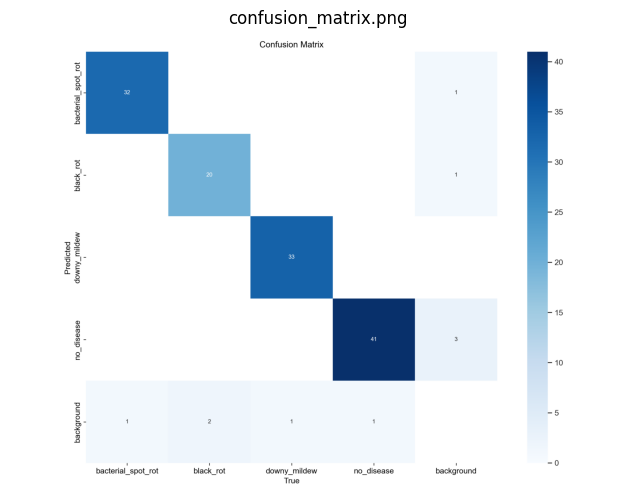

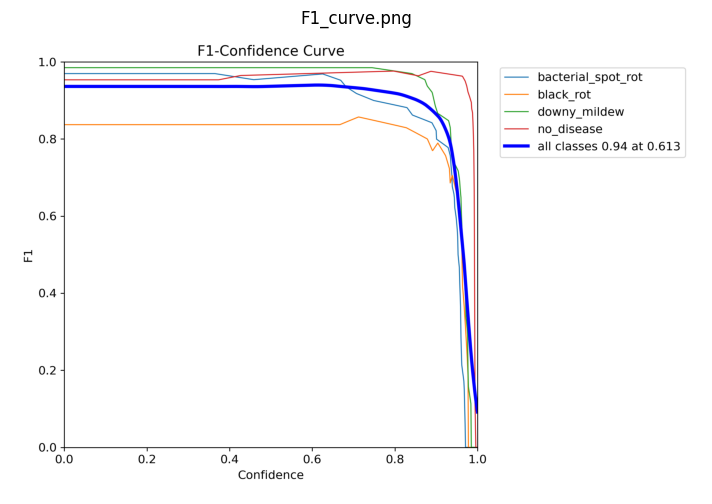

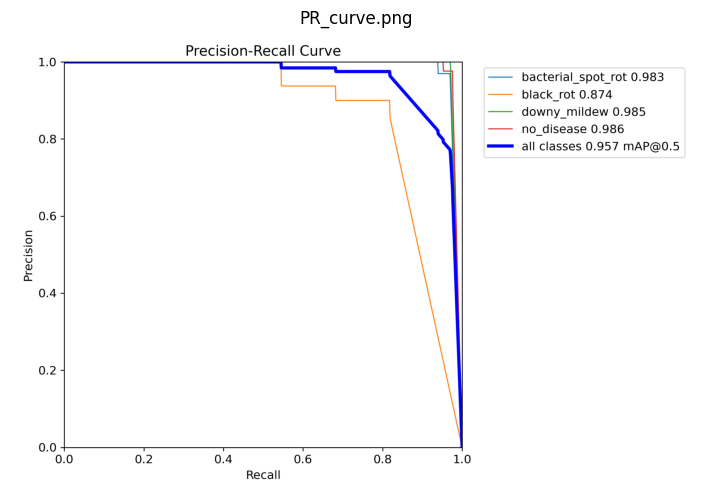

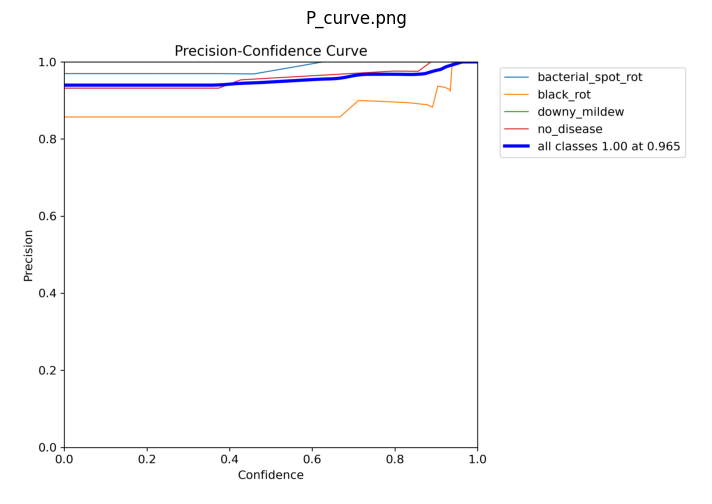

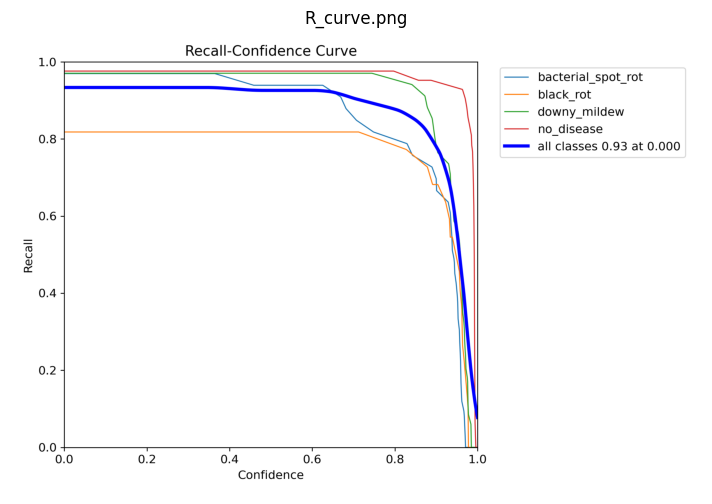

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Directory where plots are saved
plot_dir = "yolov8-kaggle-validation/val_output"

# List of plots to display
plot_files = [
    "confusion_matrix.png",
    "F1_curve.png",
    "PR_curve.png",
    "P_curve.png",
    "R_curve.png",
]

# Display each plot
for plot_file in plot_files:
    plot_path = os.path.join(plot_dir, plot_file)
    if os.path.exists(plot_path):
        img = mpimg.imread(plot_path)
        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(plot_file)
        plt.show()
    else:
        print(f"⚠️ Plot not found: {plot_file}")

# YOLOV9

In [7]:
import ultralytics
ultralytics.checks()


Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
Setup complete  (28 CPUs, 31.8 GB RAM, 4.0/500.5 GB disk)


In [10]:
!yolo task=detect  mode=train data=Cauliflower-Diseases-Recognition-3/data.yaml model=yolov9c.yaml epochs=100 imgsz=640 batch=16

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.


train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels.cache... 449 images, 0 backgrounds, 0 corrupt: 100%|██████████| 449/449 [00:00<?, ?it/s]
train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels.cache... 449 images, 0 backgrounds, 0 corrupt: 100%|██████████| 449/449 [00:00<?, ?it/s]

val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]
val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]
      1/100      10.8G       2.97      3.865       4.21         41        640:   0


New https://pypi.org/project/ultralytics/8.3.169 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
engine\trainer: task=detect, mode=train, model=yolov9c.yaml, data=Cauliflower-Diseases-Recognition-3/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=F

In [11]:
from IPython.display import Image, display

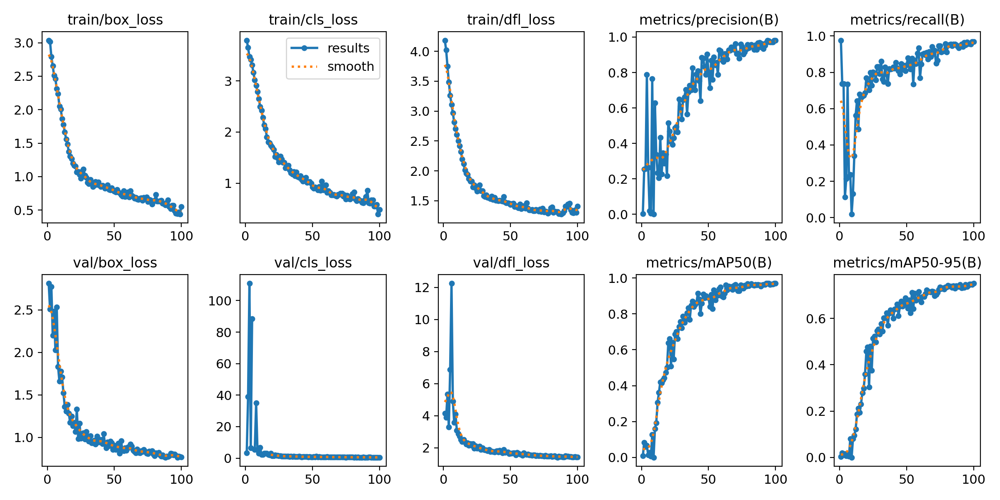

In [12]:
display(Image(filename=f"runs/detect/train2/results.png", width=1000))

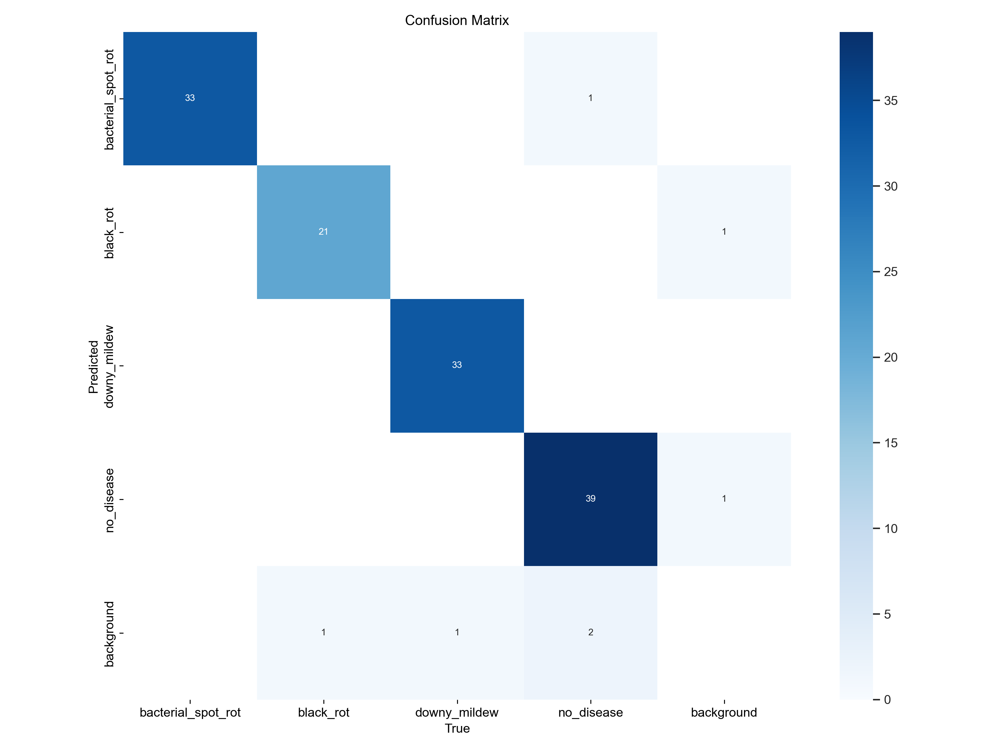

In [13]:
display(Image(filename=f"runs/detect/train2/confusion_matrix.png", width=1000))

In [14]:
!yolo task=detect mode=predict model=runs/detect/train2/weights/best.pt imgsz=640 conf=0.5 \
source=Cauliflower-Diseases-Recognition-3/test/images

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
Ultralytics 8.3.63 🚀 Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLOv9c summary (fused): 384 layers, 25,322,332 parameters, 0 gradients, 102.3 GFLOPs

image 1/66 d:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\test\images\Bacterial-Spot_-110-_jpg.rf.9c0cb7762c8796976f91a1540323a203.jpg: 640x640 1 bacterial_spot_rot, 11.6ms
image 2/66 d:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\test\images\Bacterial-Spot_-116-_jpg.rf.204a47dfa7853319f7eb48bbba1c533b.jpg: 640x640 1 bacterial_spot_rot, 11.0ms
image 3/66 d:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\test\images\Bacterial-Spot_-117-_jpg.rf.e20185265bf0c1008fb5f9799684a43e.jpg: 640x640 1 bacterial_spot_rot, 11.5ms
image 4/66 d:\TK195770--AISHWARYA--Ca

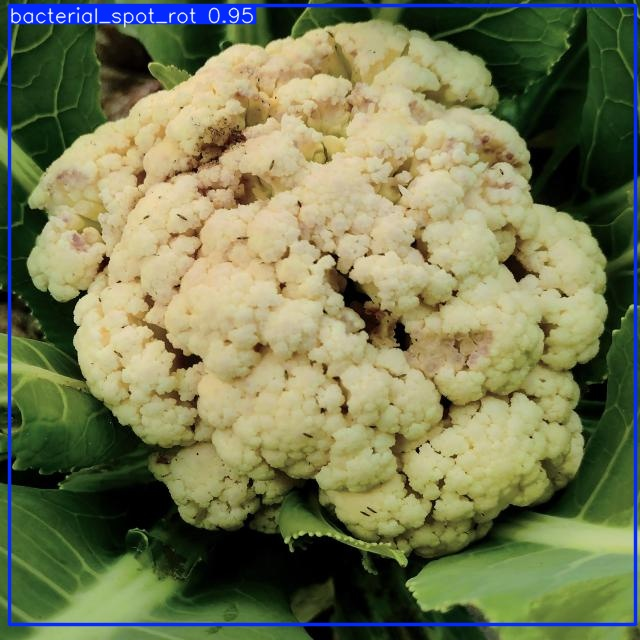

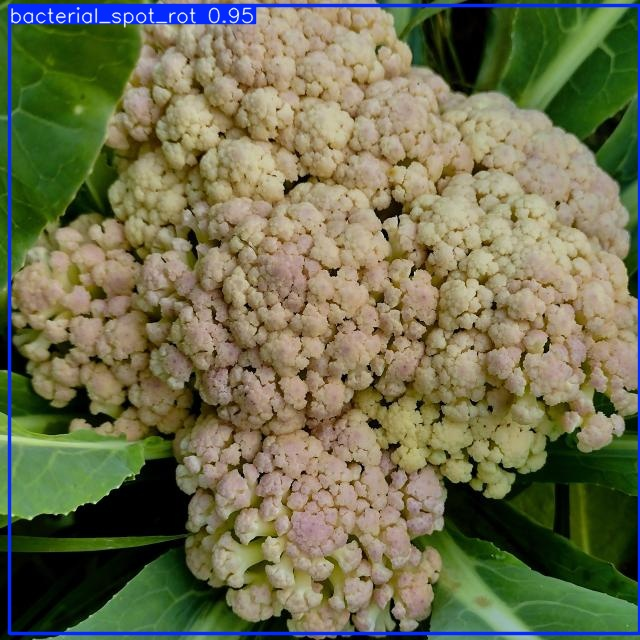

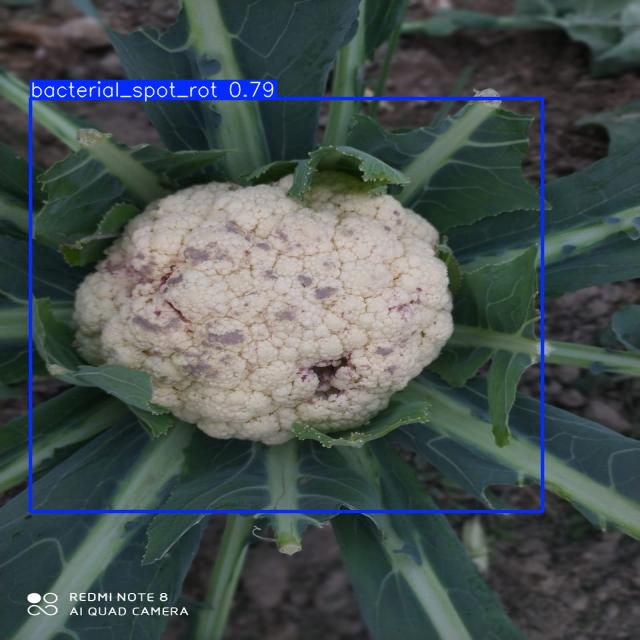

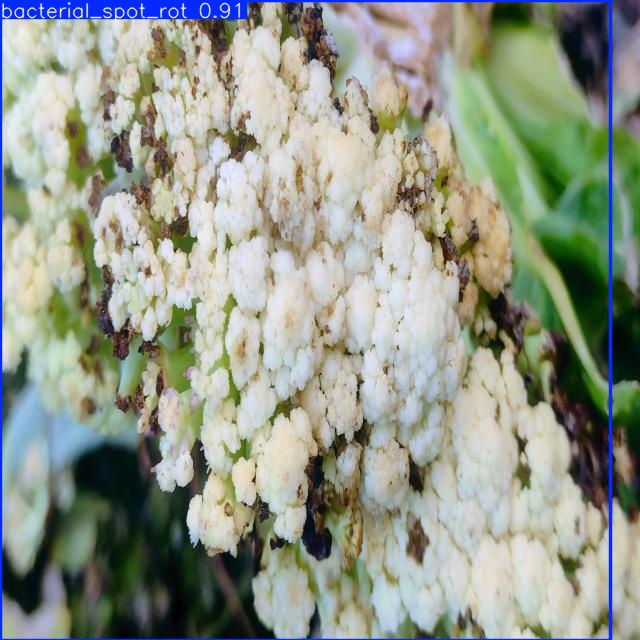

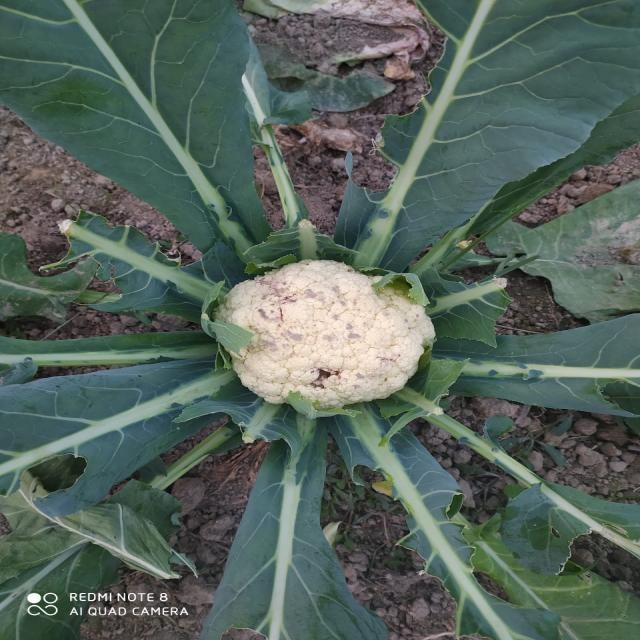

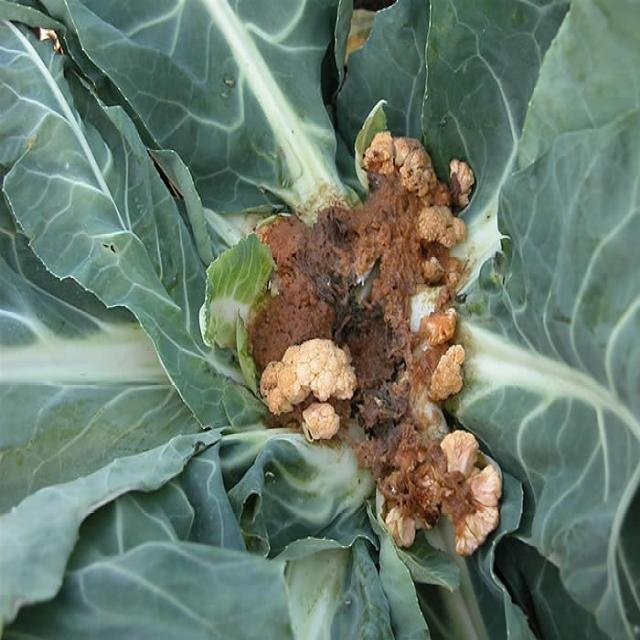

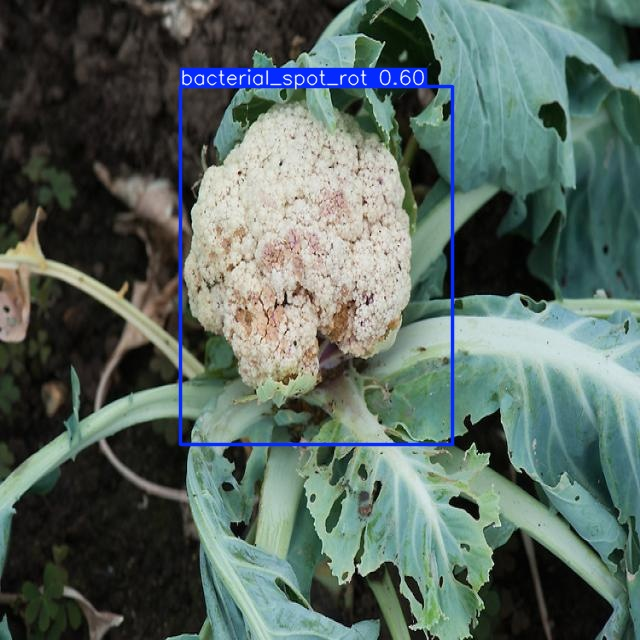

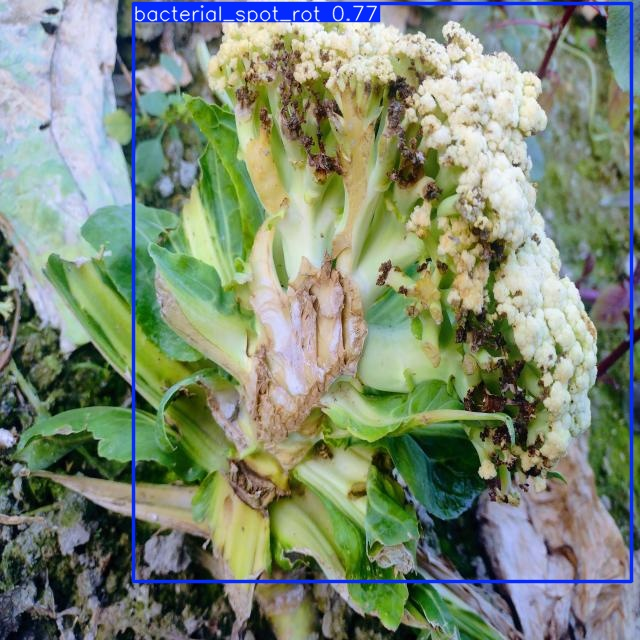

In [15]:
# Display inference on ALL test images
import glob
from IPython.display import Image, display


for imageName in glob.glob("runs/detect/predict/*.jpg")[2:10] :#assuming JPG
    print("\n")
    display(Image(filename=imageName))

# YOLOV10

In [16]:
from ultralytics import YOLO

model = YOLO("yolov10n.pt")

100%|██████████| 5.59M/5.59M [00:00<00:00, 15.8MB/s]


In [17]:
model.train(data="Cauliflower-Diseases-Recognition-3/data.yaml", epochs=30, imgsz=640 , batch=8)

New https://pypi.org/project/ultralytics/8.3.169 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
engine\trainer: task=detect, mode=train, model=yolov10n.pt, data=Cauliflower-Diseases-Recognition-3/data.yaml, epochs=30, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, 

train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels.cache... 449 images, 0 backgrounds, 0 corrupt: 100%|██████████| 449/449 [00:00<?, ?it/s]
val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]


Plotting labels to runs\detect\train3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train3
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      1.57G      1.349      8.085      2.833          1        640: 100%|██████████| 57/57 [00:09<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 10.95it/s]

                   all        127        131     0.0046      0.989      0.267      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      1.66G      1.367       6.08      2.769          2        640: 100%|██████████| 57/57 [00:11<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.07it/s]

                   all        127        131      0.596      0.204      0.272      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      1.66G      1.533      5.407      2.836          3        640: 100%|██████████| 57/57 [00:08<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]

                   all        127        131       0.45      0.511      0.492      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      1.65G      1.473       4.68      2.741          2        640: 100%|██████████| 57/57 [00:06<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.81it/s]

                   all        127        131       0.52      0.319      0.416       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      1.66G      1.442      4.154      2.743          1        640: 100%|██████████| 57/57 [00:11<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.80it/s]

                   all        127        131      0.538       0.62      0.589      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      1.66G      1.444      3.918       2.79          2        640: 100%|██████████| 57/57 [00:05<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.56it/s]

                   all        127        131      0.733      0.628      0.767      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      1.66G       1.44      3.655       2.73          4        640: 100%|██████████| 57/57 [00:09<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.02it/s]

                   all        127        131      0.567      0.582      0.549       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      1.66G      1.373       3.23      2.729          3        640: 100%|██████████| 57/57 [00:08<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.59it/s]

                   all        127        131      0.734      0.704      0.818      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      1.66G      1.316      2.986      2.641          4        640: 100%|██████████| 57/57 [00:06<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.96it/s]

                   all        127        131      0.732      0.706      0.802      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      1.66G      1.359      2.859      2.671          2        640: 100%|██████████| 57/57 [00:11<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.56it/s]

                   all        127        131      0.756      0.792      0.842      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      1.66G      1.339      2.632      2.684          2        640: 100%|██████████| 57/57 [00:08<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]

                   all        127        131      0.767       0.77      0.855      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      1.65G      1.252      2.548      2.557          4        640: 100%|██████████| 57/57 [00:06<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.02it/s]

                   all        127        131      0.754      0.827      0.857      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      1.66G      1.259      2.425      2.617          3        640: 100%|██████████| 57/57 [00:11<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.90it/s]

                   all        127        131      0.871      0.804      0.897      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      1.66G      1.243       2.42      2.571          2        640: 100%|██████████| 57/57 [00:05<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.97it/s]

                   all        127        131      0.785      0.786      0.891      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      1.66G      1.195      2.122      2.507          4        640: 100%|██████████| 57/57 [00:04<00:00, 11.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.91it/s]

                   all        127        131      0.894      0.726      0.874      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      1.66G      1.129      2.078      2.463          4        640: 100%|██████████| 57/57 [00:11<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.24it/s]

                   all        127        131       0.91       0.81       0.89      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      1.66G      1.227      2.106      2.552          4        640: 100%|██████████| 57/57 [00:05<00:00, 10.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]

                   all        127        131      0.805      0.834      0.886      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      1.66G      1.165      2.009      2.537          2        640: 100%|██████████| 57/57 [00:11<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.11it/s]

                   all        127        131      0.892      0.794      0.914      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      1.66G      1.125       1.84      2.467          4        640: 100%|██████████| 57/57 [00:12<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.38it/s]

                   all        127        131      0.848      0.832      0.916      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      1.65G       1.09      1.758      2.455          2        640: 100%|██████████| 57/57 [00:13<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.89it/s]

                   all        127        131      0.817      0.796      0.857      0.657


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      1.66G     0.9303      2.417      2.713          1        640: 100%|██████████| 57/57 [00:13<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.31it/s]

                   all        127        131      0.906      0.838      0.935       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      1.66G     0.9099      2.128      2.593          1        640: 100%|██████████| 57/57 [00:10<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.28it/s]

                   all        127        131       0.94      0.851      0.957      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      1.66G     0.8997      1.927      2.595          1        640: 100%|██████████| 57/57 [00:15<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]

                   all        127        131      0.924      0.856      0.937      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      1.66G     0.8188      1.851        2.5          1        640: 100%|██████████| 57/57 [00:05<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.04it/s]

                   all        127        131       0.97      0.885      0.961      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      1.66G     0.8188      1.676      2.462          1        640: 100%|██████████| 57/57 [00:05<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.73it/s]

                   all        127        131      0.914      0.908      0.958      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      1.66G     0.7733       1.68      2.491          1        640: 100%|██████████| 57/57 [00:11<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.03it/s]

                   all        127        131      0.939      0.922      0.963       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      1.66G     0.7661      1.584      2.449          1        640: 100%|██████████| 57/57 [00:06<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]

                   all        127        131      0.946      0.936      0.967      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      1.65G     0.7417      1.506       2.45          1        640: 100%|██████████| 57/57 [00:08<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.92it/s]

                   all        127        131      0.971      0.944      0.968      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      1.66G     0.7088      1.407      2.399          1        640: 100%|██████████| 57/57 [00:10<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.24it/s]

                   all        127        131      0.949      0.915      0.965      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      1.66G     0.7077      1.407      2.394          1        640: 100%|██████████| 57/57 [00:05<00:00, 11.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.18it/s]

                   all        127        131      0.941      0.918      0.962      0.753



30 epochs completed in 0.102 hours.
Optimizer stripped from runs\detect\train3\weights\last.pt, 5.8MB
Optimizer stripped from runs\detect\train3\weights\best.pt, 5.8MB

Validating runs\detect\train3\weights\best.pt...
Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLOv10n summary (fused): 285 layers, 2,695,976 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.18it/s]


                   all        127        131      0.969      0.885      0.961      0.773
    bacterial_spot_rot         33         33      0.967      0.897      0.988      0.802
             black_rot         21         22      0.969      0.818      0.931      0.579
          downy_mildew         33         34      0.941      0.912      0.972      0.779
            no_disease         40         42          1      0.914      0.953      0.933
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs\detect\train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002864DAE0BB0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
       

In [18]:
trained_model = model = YOLO("runs/detect/train3/weights/best.pt")

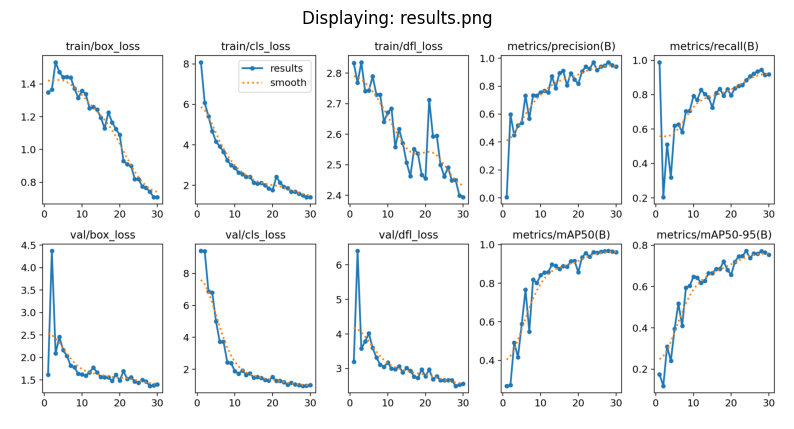

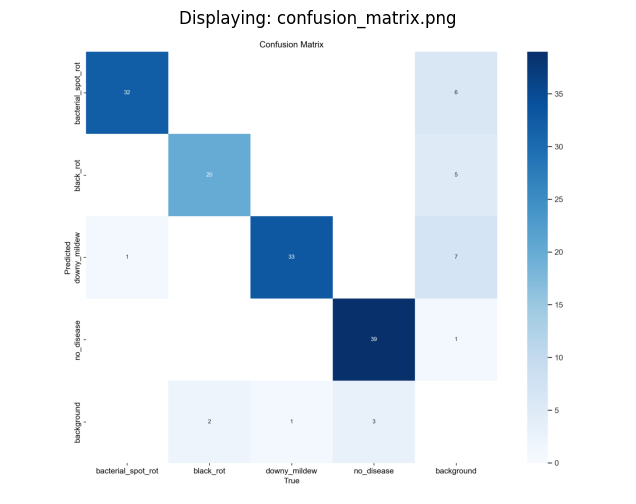

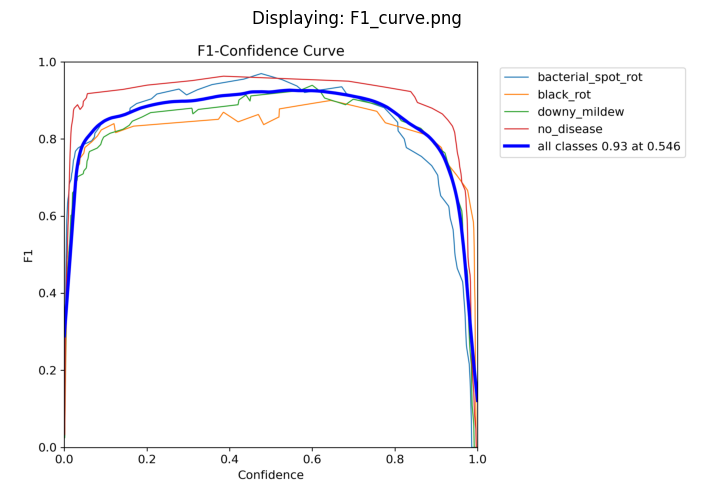

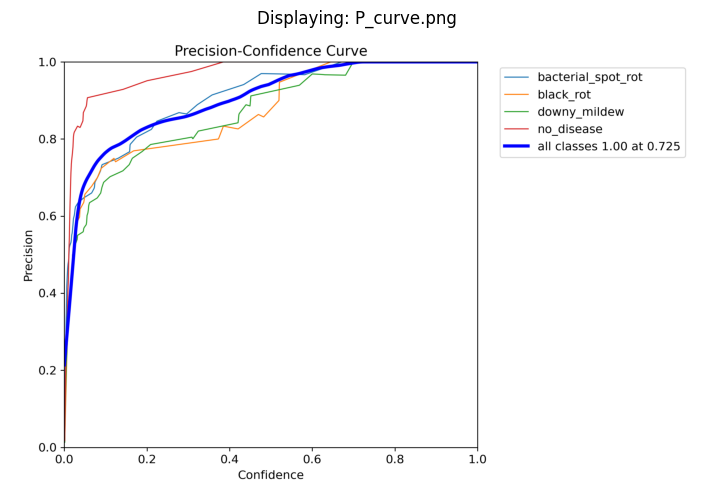

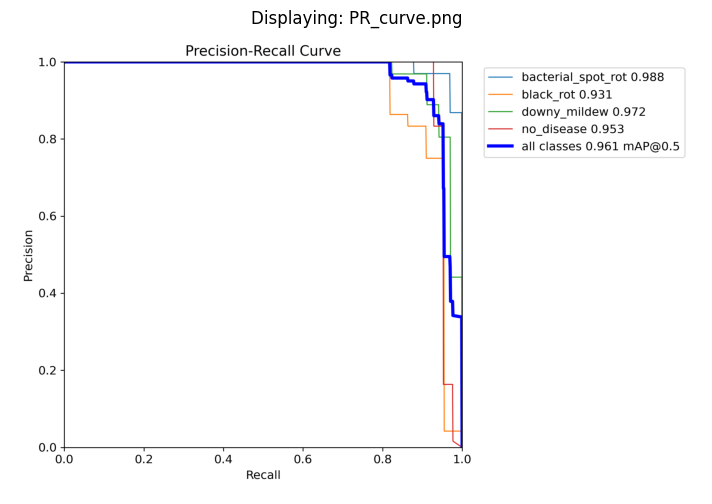

In [19]:
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg

# Define the directory where the plots are saved
results_dir = r"runs\detect\train3"



# List of plot files to display
plot_files = [
    "results.png",                # Overall training results plot
    "confusion_matrix.png",       # Confusion matrix plot
    "F1_curve.png", # Precision-recall curve plot
    "P_curve.png",              # Loss plot
    "PR_curve.png",             # Train loss plot
]

# Iterate over each plot file and display it using matplotlib
for plot_file in plot_files:
    plot_path = os.path.join(results_dir, plot_file)
    
    # Check if the plot file exists
    if os.path.exists(plot_path):
        # Load the plot image
        img = mpimg.imread(plot_path)
        
        # Display the image
        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.axis('off')  # Hide axis
        plt.title(f"Displaying: {plot_file}")
        plt.show()
    else:
        print(f"{plot_file} not found in {results_dir}")


# YOLOV11

In [20]:
!yolo task=detect mode=train model=yolo11s.pt data=Cauliflower-Diseases-Recognition-3/data.yaml epochs=30 imgsz=640 plots=True


FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
New https://pypi.org/project/ultralytics/8.3.169 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
engine\trainer: task=detect, mode=train, model=yolo11s.pt, data=Cauliflower-Diseases-Recognition-3/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer


  0%|          | 0.00/18.4M [00:00<?, ?B/s]
  5%|▌         | 1.00M/18.4M [00:00<00:01, 10.1MB/s]
 16%|█▌        | 2.88M/18.4M [00:00<00:01, 15.1MB/s]
 25%|██▌       | 4.62M/18.4M [00:00<00:00, 15.9MB/s]
 36%|███▌      | 6.62M/18.4M [00:00<00:00, 17.7MB/s]
 49%|████▉     | 9.00M/18.4M [00:00<00:00, 20.0MB/s]
 60%|█████▉    | 11.0M/18.4M [00:00<00:00, 13.7MB/s]
 69%|██████▉   | 12.8M/18.4M [00:00<00:00, 14.3MB/s]
 78%|███████▊  | 14.4M/18.4M [00:01<00:00, 12.6MB/s]
 86%|████████▌ | 15.8M/18.4M [00:01<00:00, 11.8MB/s]
 92%|█████████▏| 17.0M/18.4M [00:01<00:00, 10.4MB/s]
 99%|█████████▉| 18.2M/18.4M [00:01<00:00, 10.8MB/s]
100%|██████████| 18.4M/18.4M [00:01<00:00, 12.9MB/s]

train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels.cache... 449 images, 0 backgrounds, 0 corrupt: 100%|██████████| 449/449 [00:00<?, ?it/s]
train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Dis

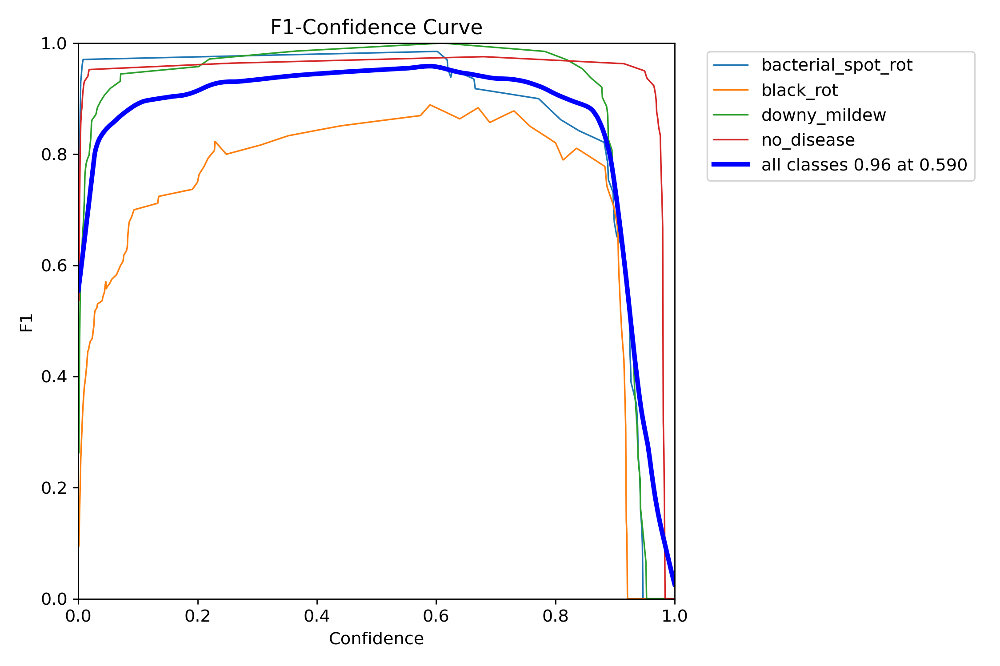

In [21]:
from IPython.display import Image as IPyImage

IPyImage(filename='runs/detect/train4/F1_curve.png', width=600)

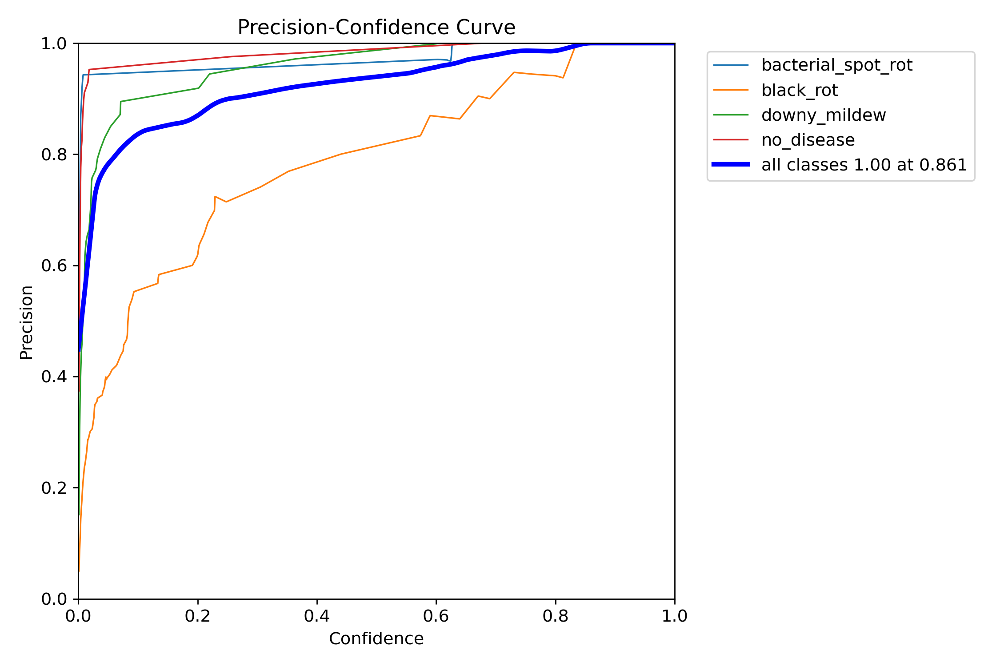

In [22]:
from IPython.display import Image as IPyImage

IPyImage(filename='runs/detect/train4/P_curve.png', width=600)

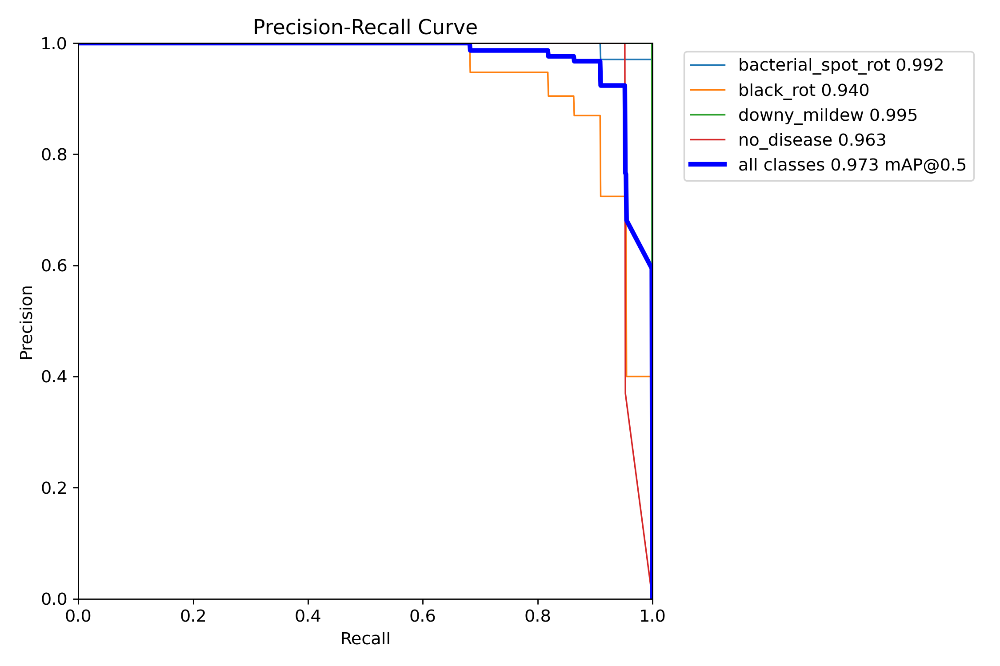

In [23]:
from IPython.display import Image as IPyImage

IPyImage(filename='runs/detect/train4/PR_curve.png', width=600)

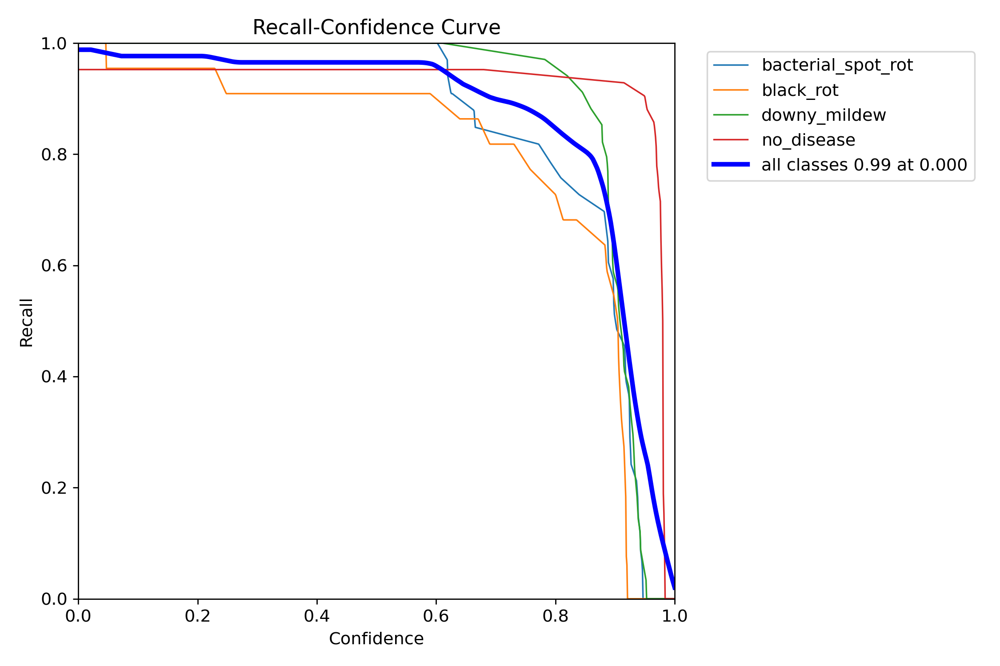

In [24]:
IPyImage(filename='runs/detect/train4/R_curve.png', width=600)

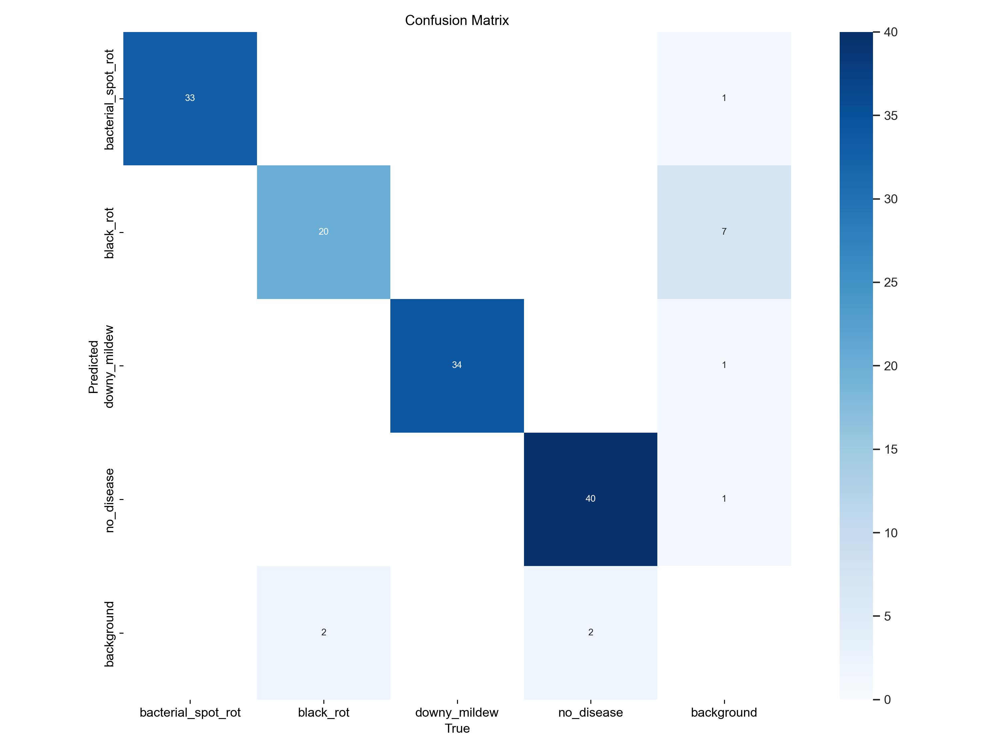

In [25]:
IPyImage(filename='runs/detect/train4/confusion_matrix.png', width=600)

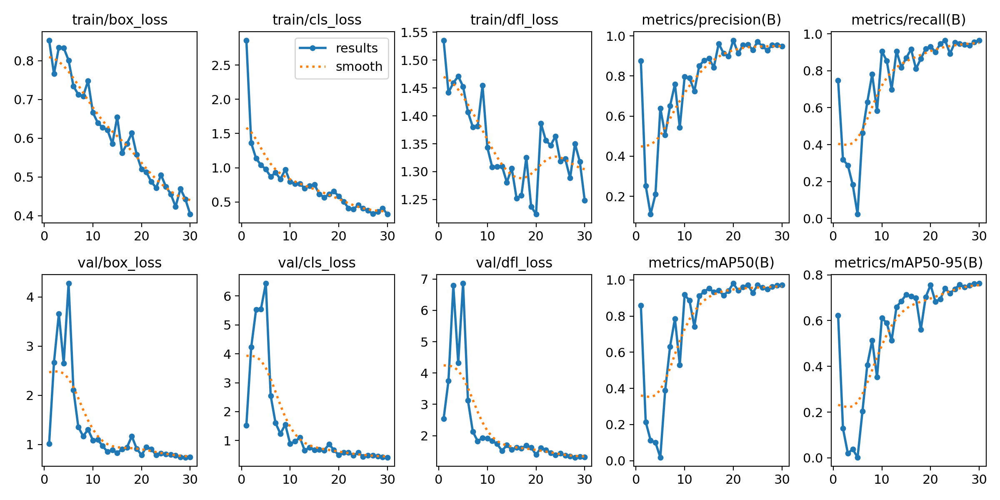

In [26]:
IPyImage(filename='runs/detect/train4/results.png', width=600)

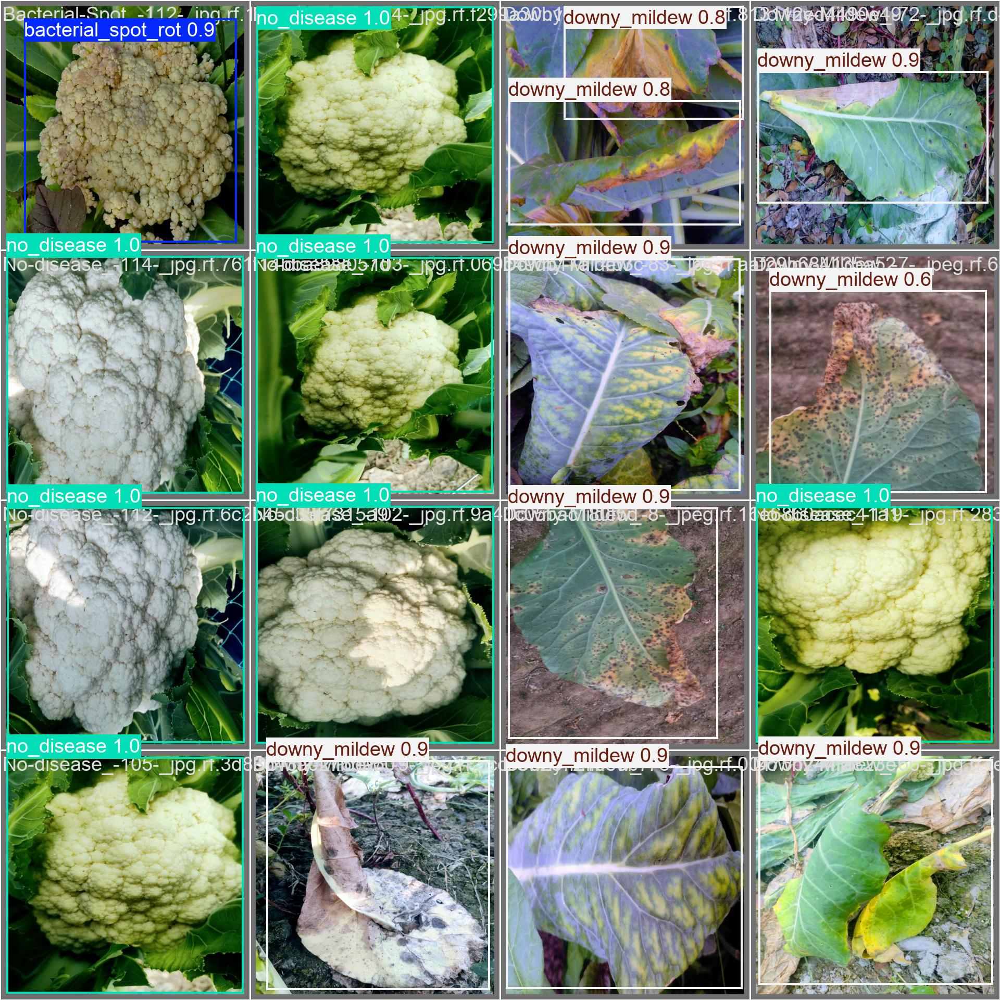

In [27]:
IPyImage(filename='runs/detect/train4/val_batch0_pred.jpg', width=600)

In [29]:
!yolo task=detect mode=val model=runs/detect/train4/weights/best.pt data=Cauliflower-Diseases-Recognition-3/data.yaml

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
Ultralytics 8.3.63 🚀 Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 238 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
FlashAttention is not available on this device. Using scaled_dot_product_attenti


val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]
val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▎        | 1/8 [00:00<00:05,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 2/8 [00:00<00:02,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 3/8 [00:01<00:01,  3.43it/s]
                 Class    

In [31]:
!yolo task=detect mode=predict model=runs/detect/train4/weights/best.pt conf=0.25 source=Cauliflower-Diseases-Recognition-3/test/images save=True

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
Ultralytics 8.3.63 🚀 Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 238 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs

image 1/66 d:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\test\images\Bacterial-Spot_-110-_jpg.rf.9c0cb7762c8796976f91a1540323a203.jpg: 640x640 1 bacterial_spot_rot, 6.0ms
image 2/66 d:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\test\images\Bacterial-Spot_-116-_jpg.rf.204a47dfa7853319f7eb48bbba1c533b.jpg: 640x640 1 bacterial_spot_rot, 1 black_rot, 6.4ms
image 3/66 d:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\test\images\Bacterial-Spot_-117-_jpg.rf.e20185265bf0c1008fb5f9799684a43e.jpg: 640x640 1 bacterial_spot_rot, 6.0ms
image 4/66 d:\TK195770--AISHW

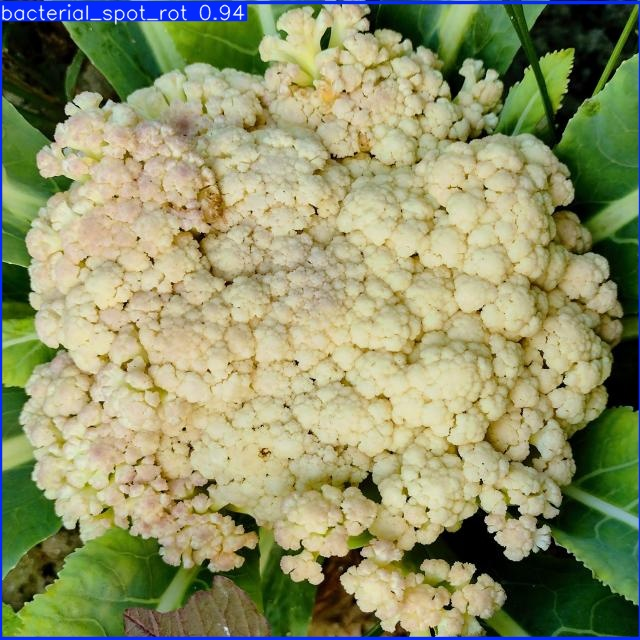

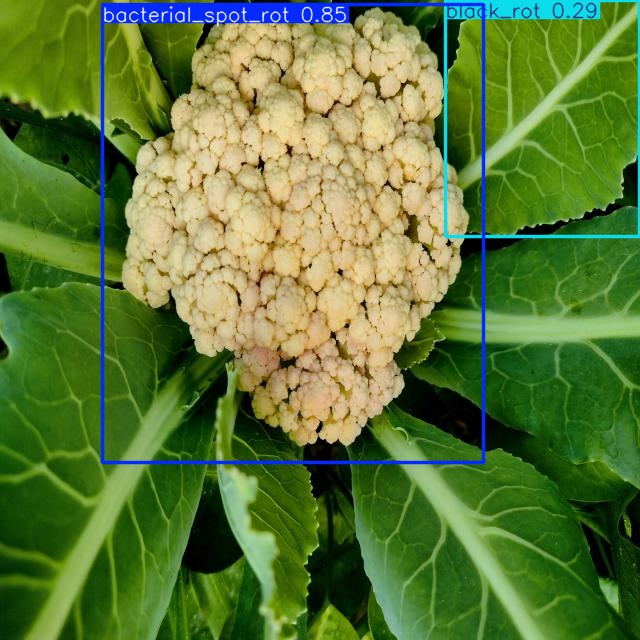

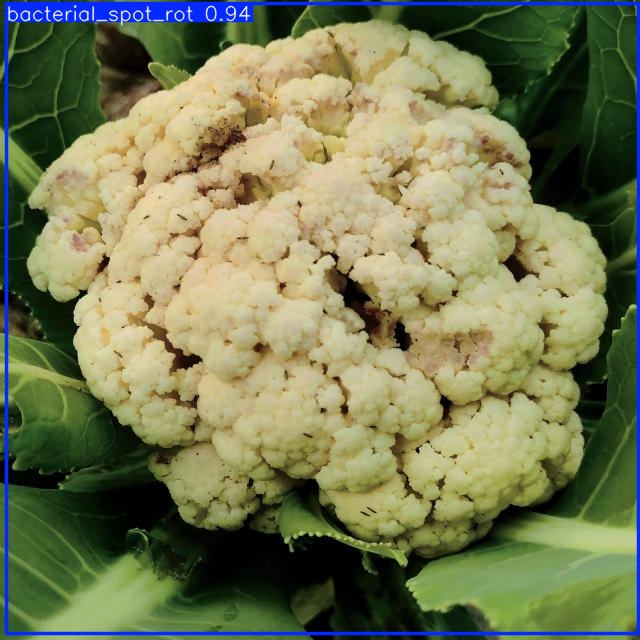

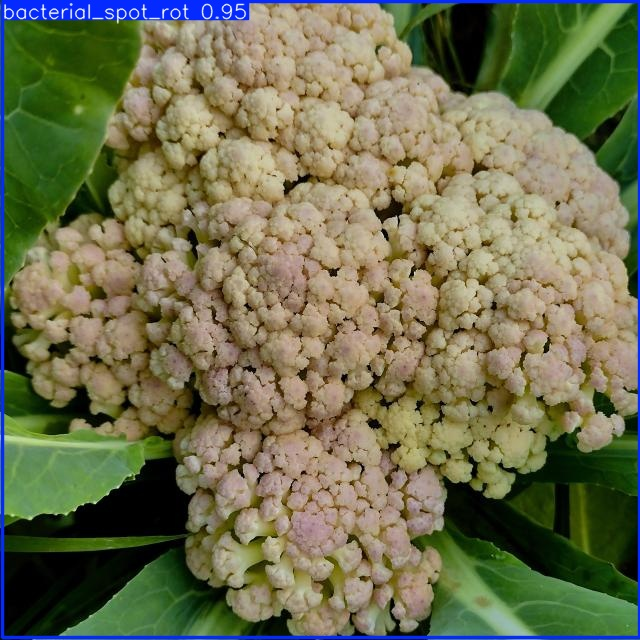

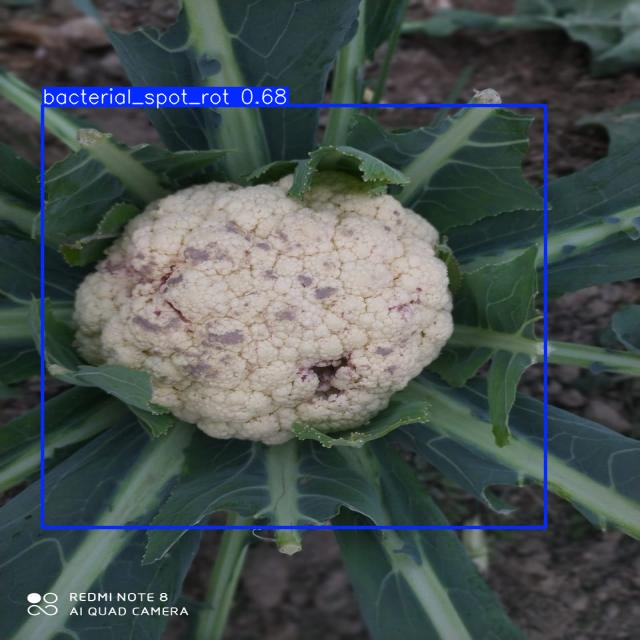

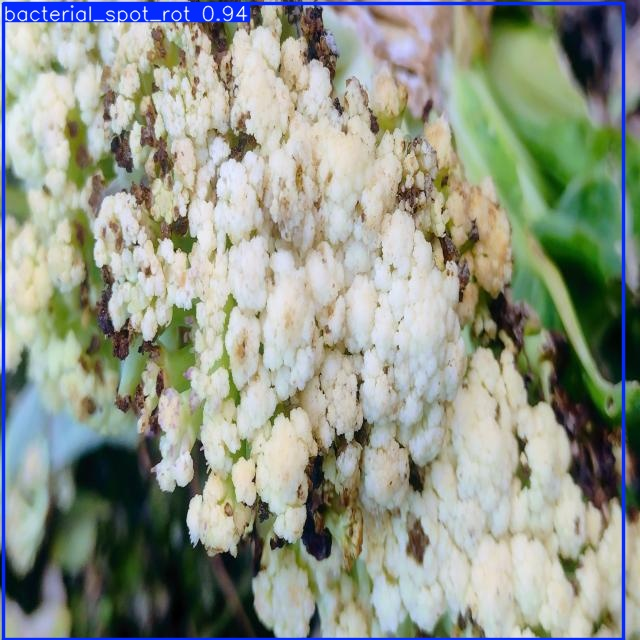

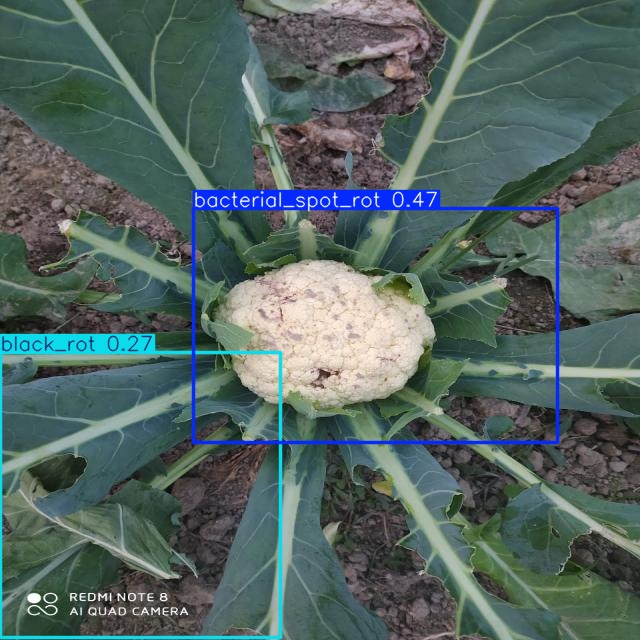

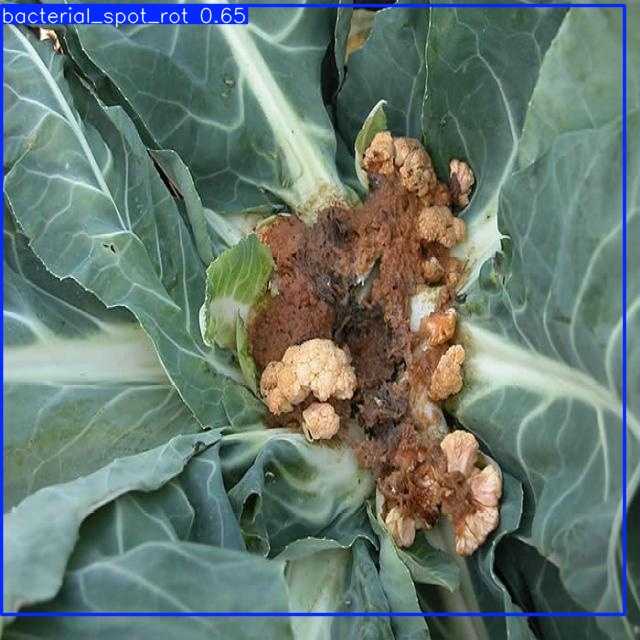

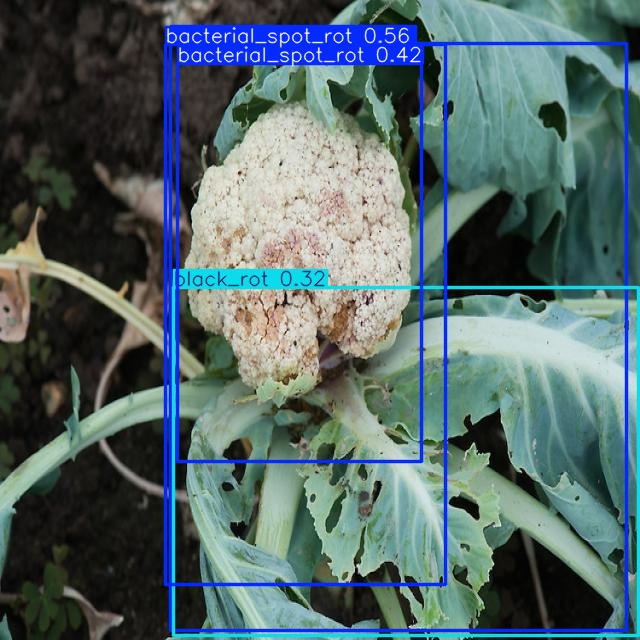

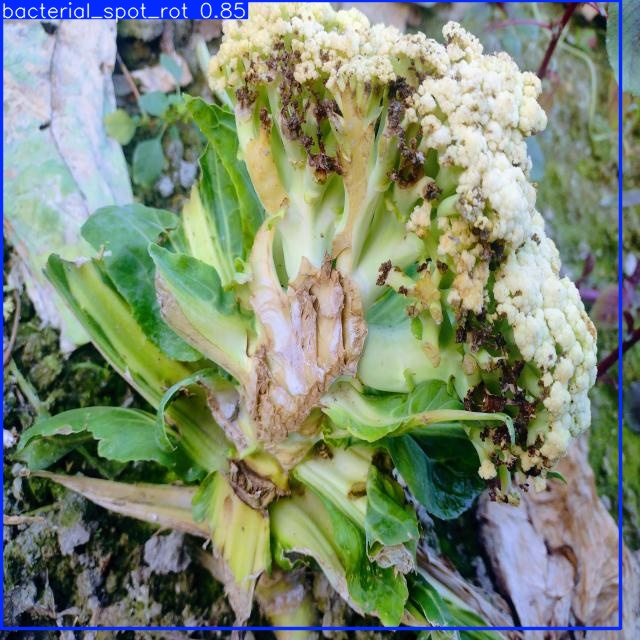

In [32]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('runs/detect/predict2/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:10]:
    display(IPyImage(filename=img, width=600))
    print("\n")

# YOLOV12


In [33]:
from ultralytics import YOLO

model = YOLO('yolov12n.pt')
    
# results = model.train(data='/kaggle/working/Pedestrian-Detection.-1/data.yaml', epochs=2)

In [34]:
# results = model.train(data='/kaggle/working/Pedestrian-Detection.-1/data.yaml', epochs=2)

results = model.train(
  data=r'Cauliflower-Diseases-Recognition-3\data.yaml',
  epochs=30, 
  batch=2, 
  imgsz=416,
  scale=0.5,  # S:0.9; M:0.9; L:0.9; X:0.9
  mosaic=1.0,
  mixup=0.0,  # S:0.05; M:0.15; L:0.15; X:0.2
  copy_paste=0.1,  # S:0.15; M:0.4; L:0.5; X:0.6
)

New https://pypi.org/project/ultralytics/8.3.169 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
engine\trainer: task=detect, mode=train, model=yolov12n.pt, data=Cauliflower-Diseases-Recognition-3\data.yaml, epochs=30, time=None, patience=100, batch=2, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, 

train: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\train\labels.cache... 449 images, 0 backgrounds, 0 corrupt: 100%|██████████| 449/449 [00:00<?, ?it/s]
val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]


Plotting labels to runs\detect\train5\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to runs\detect\train5
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30     0.327G     0.6979      2.908      1.287          1        416: 100%|██████████| 225/225 [00:18<00:00, 11.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 24.81it/s]

                   all        127        131      0.495      0.502      0.526      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30     0.306G     0.8027      2.259      1.326          4        416: 100%|██████████| 225/225 [00:16<00:00, 13.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 27.36it/s]

                   all        127        131      0.603      0.697      0.689      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30     0.304G     0.8709      1.834       1.35          2        416: 100%|██████████| 225/225 [00:16<00:00, 13.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 26.49it/s]

                   all        127        131      0.504      0.525      0.451      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30     0.304G      0.795      1.559      1.288          2        416: 100%|██████████| 225/225 [00:16<00:00, 13.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 26.25it/s]

                   all        127        131      0.463      0.718      0.641       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30     0.304G     0.8388      1.443      1.327          1        416: 100%|██████████| 225/225 [00:16<00:00, 13.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 25.89it/s]

                   all        127        131      0.678      0.697      0.753      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30     0.304G     0.7973      1.419      1.286          2        416: 100%|██████████| 225/225 [00:17<00:00, 13.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 27.60it/s]

                   all        127        131      0.769       0.82      0.862      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30     0.304G     0.8167      1.372      1.304          4        416: 100%|██████████| 225/225 [00:17<00:00, 12.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 25.40it/s]

                   all        127        131      0.779      0.855      0.848      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30     0.304G     0.7549      1.288       1.27          3        416: 100%|██████████| 225/225 [00:17<00:00, 13.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 25.73it/s]

                   all        127        131      0.855      0.873      0.919       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30     0.304G     0.7197      1.172      1.221          4        416: 100%|██████████| 225/225 [00:17<00:00, 13.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 24.98it/s]

                   all        127        131      0.876      0.818        0.9      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30     0.304G     0.6906      1.194      1.215          2        416: 100%|██████████| 225/225 [00:17<00:00, 13.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 26.24it/s]

                   all        127        131      0.826      0.926      0.863      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30     0.304G     0.7376      1.117      1.243          2        416: 100%|██████████| 225/225 [00:17<00:00, 12.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 25.43it/s]

                   all        127        131      0.853      0.874      0.873      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30     0.304G     0.6775       1.06      1.209          4        416: 100%|██████████| 225/225 [00:17<00:00, 13.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 25.82it/s]

                   all        127        131      0.897      0.806      0.917      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30     0.304G     0.6571      1.042      1.188          2        416: 100%|██████████| 225/225 [00:17<00:00, 13.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 25.01it/s]

                   all        127        131      0.937      0.884      0.909      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30     0.304G     0.6414     0.9751      1.191          2        416: 100%|██████████| 225/225 [00:34<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 13.81it/s]

                   all        127        131      0.819      0.815      0.826      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30     0.304G     0.6223     0.9657      1.166          4        416: 100%|██████████| 225/225 [00:37<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.39it/s]

                   all        127        131      0.938      0.911      0.956      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30     0.304G     0.6407     0.9776      1.179          4        416: 100%|██████████| 225/225 [00:37<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.69it/s]

                   all        127        131      0.937        0.9      0.954      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30     0.304G     0.5987     0.9399      1.179          3        416: 100%|██████████| 225/225 [00:37<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 13.85it/s]

                   all        127        131      0.932      0.907      0.952      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30     0.304G     0.5679     0.8807      1.141          2        416: 100%|██████████| 225/225 [00:37<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 12.26it/s]

                   all        127        131      0.844      0.888      0.947       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30     0.304G     0.5674     0.8347      1.145          4        416: 100%|██████████| 225/225 [00:36<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.60it/s]

                   all        127        131      0.915      0.881       0.96      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30     0.304G     0.5905     0.8653       1.16          3        416: 100%|██████████| 225/225 [00:37<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 13.89it/s]

                   all        127        131      0.966      0.871      0.946      0.738


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30     0.304G     0.4835      0.849        1.2          1        416: 100%|██████████| 225/225 [00:37<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.30it/s]

                   all        127        131      0.916      0.924       0.96      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30     0.304G     0.4589     0.6948      1.174          1        416: 100%|██████████| 225/225 [00:36<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.92it/s]

                   all        127        131      0.911      0.956      0.964      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30     0.304G     0.4523     0.6824       1.16          1        416: 100%|██████████| 225/225 [00:38<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 13.63it/s]

                   all        127        131      0.943      0.972      0.975       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30     0.304G     0.4024     0.5921      1.106          1        416: 100%|██████████| 225/225 [00:37<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 12.04it/s]

                   all        127        131      0.972      0.908      0.963      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30     0.304G     0.4155       0.58      1.128          1        416: 100%|██████████| 225/225 [00:37<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.60it/s]

                   all        127        131      0.935      0.927      0.961      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30     0.304G     0.4009     0.5372      1.112          1        416: 100%|██████████| 225/225 [00:38<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 13.60it/s]

                   all        127        131      0.949      0.959       0.96      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30     0.304G     0.3872     0.4693      1.109          1        416: 100%|██████████| 225/225 [00:37<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.64it/s]

                   all        127        131      0.976      0.931      0.971      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30     0.304G     0.3895      0.459      1.096          1        416: 100%|██████████| 225/225 [00:36<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.31it/s]

                   all        127        131      0.949      0.934      0.969      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30     0.304G     0.3745      0.465      1.127          1        416: 100%|██████████| 225/225 [00:37<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 13.59it/s]

                   all        127        131      0.986      0.925      0.975      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30     0.304G      0.373     0.4521      1.097          1        416: 100%|██████████| 225/225 [00:38<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:02<00:00, 11.77it/s]

                   all        127        131       0.95      0.921      0.971      0.775



30 epochs completed in 0.269 hours.
Optimizer stripped from runs\detect\train5\weights\last.pt, 5.4MB
Optimizer stripped from runs\detect\train5\weights\best.pt, 5.4MB

Validating runs\detect\train5\weights\best.pt...
Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLOv12n summary (fused): 376 layers, 2,509,124 parameters, 0 gradients, 5.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:01<00:00, 20.14it/s]


                   all        127        131      0.986      0.923      0.975      0.776
    bacterial_spot_rot         33         33          1      0.921      0.992        0.8
             black_rot         21         22      0.945      0.864      0.959      0.568
          downy_mildew         33         34          1      0.967      0.991      0.815
            no_disease         40         42          1       0.94      0.956      0.923
Speed: 0.4ms preprocess, 5.9ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs\detect\train5


In [35]:
metrics = model.val()

Ultralytics 8.3.63  Python-3.10.16 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLOv12n summary (fused): 376 layers, 2,509,124 parameters, 0 gradients, 5.8 GFLOPs


val: Scanning D:\TK195770--AISHWARYA--Cauliflower Disease Detection\CODE\BACKEND\Cauliflower-Diseases-Recognition-3\valid\labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:01<00:00, 45.37it/s]


                   all        127        131      0.986      0.924      0.975      0.777
    bacterial_spot_rot         33         33          1      0.927      0.992        0.8
             black_rot         21         22      0.943      0.864      0.959      0.568
          downy_mildew         33         34          1      0.967      0.991      0.817
            no_disease         40         42          1       0.94      0.956      0.923
Speed: 0.3ms preprocess, 7.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\detect\train52


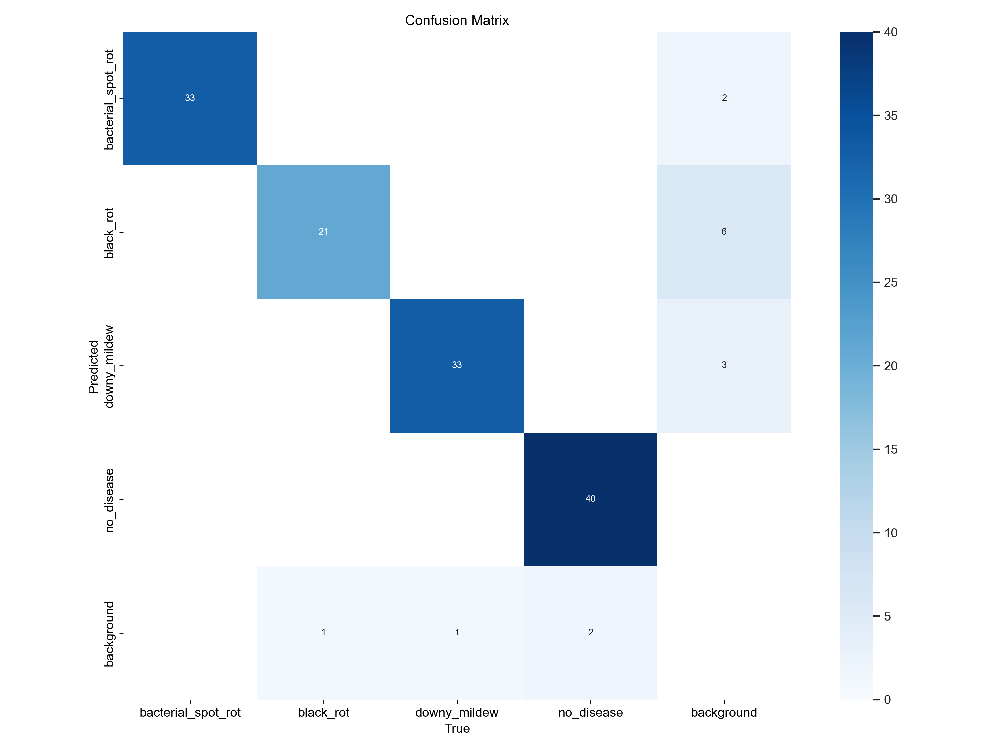

In [36]:
from IPython.display import Image

Image(filename=f'runs/detect/train5/confusion_matrix.png', width=1000)

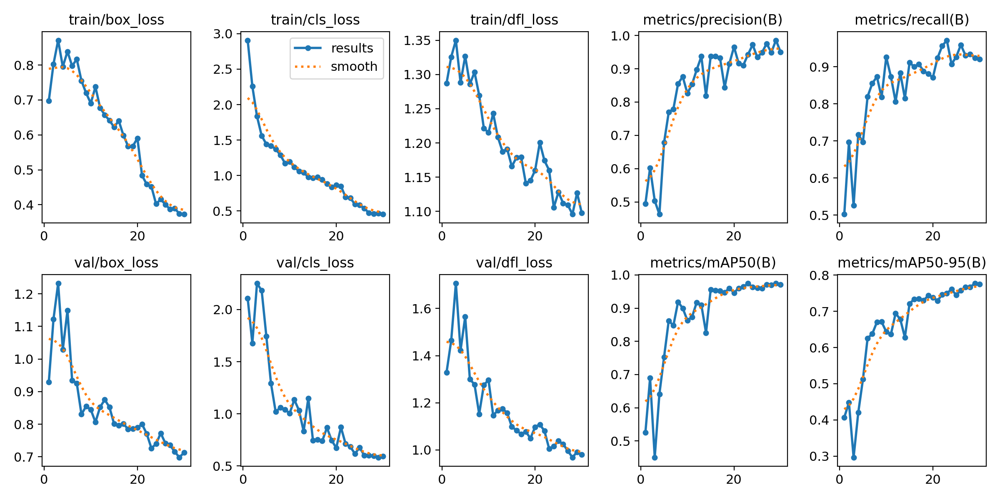

In [46]:
from IPython.display import Image

Image(filename=f'runs/detect/train5/results.png', width=1000)

In [42]:
pip install --upgrade supervision

  Using cached defusedxml-0.7.1-py2.py3-none-any.whl.metadata (32 kB)
Using cached defusedxml-0.7.1-py2.py3-none-any.whl (25 kB)

  Attempting uninstall: supervision

    Found existing installation: supervision 0.3.0

    Uninstalling supervision-0.3.0:

      Successfully uninstalled supervision-0.3.0

   -------------------- ------------------- 1/2 [supervision]
   -------------------- ------------------- 1/2 [supervision]
   -------------------- ------------------- 1/2 [supervision]
   -------------------- ------------------- 1/2 [supervision]
   ---------------------------------------- 2/2 [supervision]

Note: you may need to restart the kernel to use updated packages.


In [1]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"Cauliflower-Diseases-Recognition-3/test/images",
    annotations_directory_path=f"Cauliflower-Diseases-Recognition-3/test/labels",
    data_yaml_path=f"Cauliflower-Diseases-Recognition-3/data.yaml"
)

ds.classes

['bacterial_spot_rot', 'black_rot', 'downy_mildew', 'no_disease']

In [4]:
from supervision.metrics import MeanAveragePrecision
import supervision as sv
model = YOLO(f'runs/detect/train5/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

In [5]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)


mAP 50:95 0.7132120372670752
mAP 50 0.8753298356151406
mAP 75 0.7360335370113749


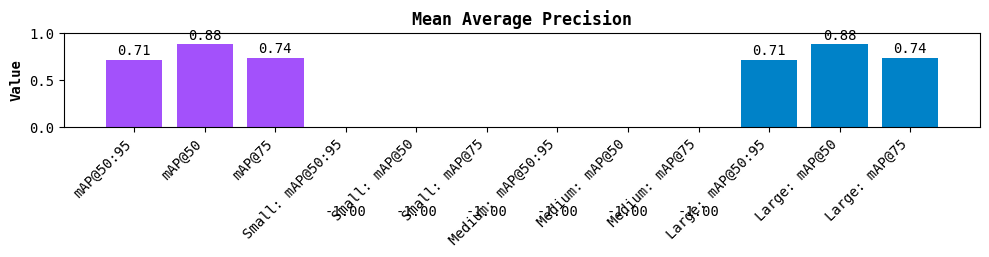

In [6]:
map.plot()

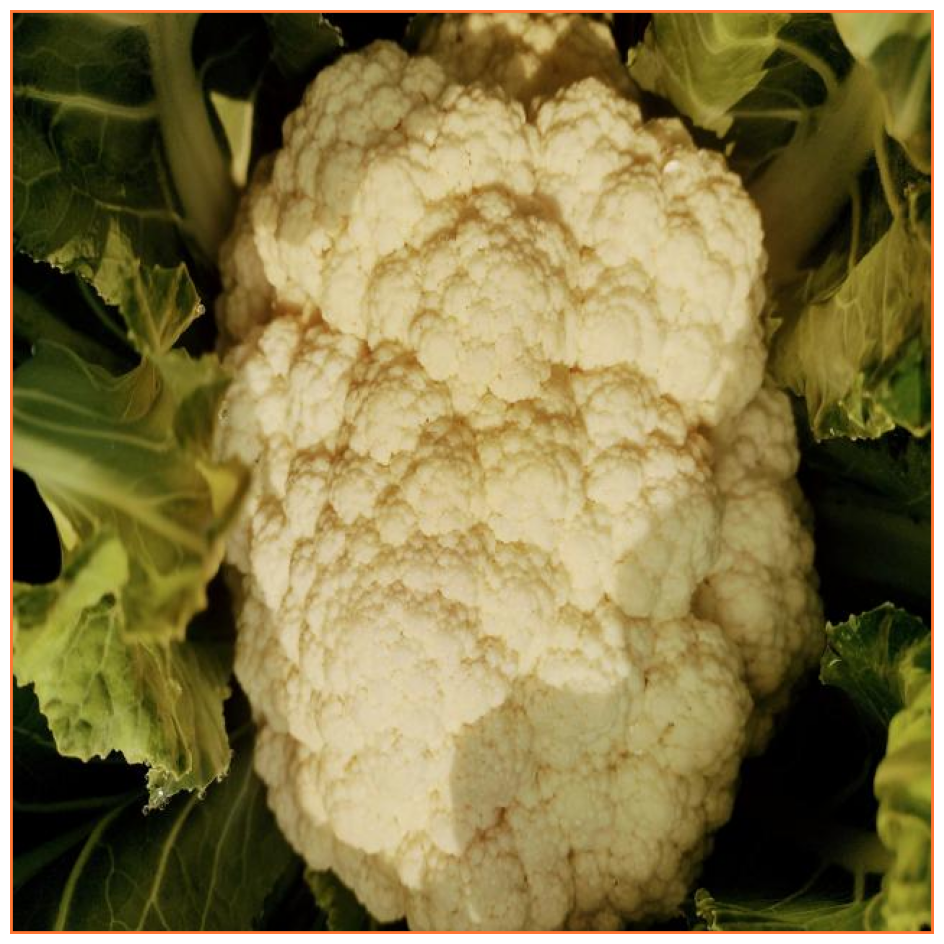

In [9]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

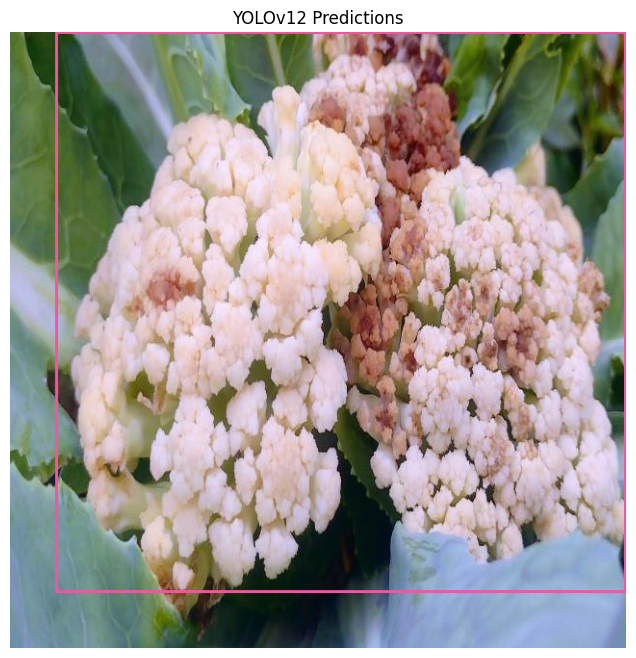

In [12]:
from ultralytics import YOLO
import supervision as sv
import cv2
from matplotlib import pyplot as plt

model = YOLO("runs/detect/train5/weights/best.pt")
image_path = r"Cauliflower-Diseases-Recognition-3\valid\images\Bacterial-Spot_-59-_jpg.rf.b328514b41ac609a109c2f8f50142bd1.jpg" 
results = model(image_path, verbose=False)[0]

detections = sv.Detections.from_ultralytics(results)

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
annotated_image = sv.BoxAnnotator().annotate(scene=image.copy(), detections=detections)
annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

plt.figure(figsize=(10, 8))
plt.imshow(annotated_image)
plt.axis("off")
plt.title("YOLOv12 Predictions")
plt.show()
